# Lösung zu Übung 2 - Aufgabe 1 - Klassifikation von Katzen und Hunden

In dieser Aufgabe soll der im Buch vorgestellte Datensatz verwendet werden, um Katzen und Hunde zu klassifizieren. Im Gegensatz zur vorherigen Aufgabe soll in dieser allerdings mittels fortgeschritteneren Netzen klassifiziert werden. Verwenden Sie dazu CNNs folgender Typen:

- Ein eigenes CNN angelehnt an das aus dem Buch
- Ein VGG Ihrer Wahl
- Ein ResNet Ihrer Wahl

Verwenden Sie zusätzlich ein Netz auf Basis von Vision Transformern. Vergleichen Sie die Ergebnisse. Gehen Sie auf diese Weise vor ist es sinnvoll sich für das Training eine wiederverwendbare Funktion zu schreiben.

Diese Aufgabe ist folgendermaßen aufgebaut:

1. Vornehmen nötiger Imports
2. Laden der Daten
3. Definition des eigenen CNN
4. Anlegen der neuronalen Netze
5. Training und Tests der neuronalen Netze

## 1. Nötige Imports vornehmen

Die folgende Code-Zelle importiert die notwendigen Bibliotheken, die im Folgenden benötigt werden.

In [1]:
from glob import glob
import os
import numpy as np
import matplotlib.pyplot as plt
import shutil
from torchvision import transforms
from torchvision import models
import torch
from torch.autograd import Variable
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import lr_scheduler
from torch import optim
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torch.utils.data import Dataset,DataLoader
import time
from tqdm.notebook import tqdm

%matplotlib inline

Wir wollen zuerst die Daten laden, die sich im Verzeichnis `data` befinden. Hierzu können wie den Pfad, in dem wir uns aktuell befinden mit `!pwd` abfragen und dann den Pfad zu den Daten sinnvoll in der Variable `path` speichern.

In [2]:
!pwd

/home/stgoe003/Aufgaben_Deep_Learning/Veranstaltung_2/Aufgabe_1


In [3]:
path = '~/Aufgaben_Deep_Learning/Veranstaltung_2/Aufgabe_1/Data/'

Bei Interesse kann der Inhalt der Verzeichnisse wie folgt eingesehen werden (wobei unser verwedeter Jupyter-Hub natürlich auch einfach eine Dateiansicht auf der linken Seite hat. In den entsprechenden Unterordnern für Trainings- und Validation-Set befinden sich für jede Klasse (hier `cat` und `dog`) entsprechende Trainingsdaten im `*.jpg` Format.

In [4]:
for i in os.listdir('./Data'):
    print(i)

train
valid


Mit dem folgenden Codeabschnitt definieren wir uns eine Hilfsfunktion `imshow()`, die für Visualisierung bzw. Anzeige unserer Daten genutzt werden kann.

In [5]:

def imshow(inp,cmap=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp,cmap)
   

## Check ob eine GPU verfügbar ist

Mit dem folgenden Code prüfen wir, on eine GPU verfügbar ist.

In [6]:
is_cuda = False
if torch.cuda.is_available():
    is_cuda = True
    print("GPU is present")
else:
    print("No GPU present")

GPU is present


## 2. Daten in PyTorch Tensoren laden

Mit der Funktion [torchvision.datasets.ImageFolder()](https://pytorch.org/vision/main/generated/torchvision.datasets.ImageFolder.html) kann als Dataloader für unsere Daten verwendet werden. Unser Dataloader transformiert beim Laden automatisch die Bilder mittels der übergeben Funktion [transforms.Compose()](https://pytorch.org/vision/main/generated/torchvision.transforms.Compose.html), die mehrere Transformationen kombiniert - im Beispiel hier:
- [transforms.Resize()](https://pytorch.org/vision/main/generated/torchvision.transforms.Resize.html) ändert die Größen unserer Trainingsdaten auf die Zielgröße $224 \times 244$. Das Bild `./train/cat/cat1.jpg` hat beispielsweis im Original eine Größe von $300 \times 280$ Pixeln.
- [transforms.ToTensor()](https://pytorch.org/vision/stable/generated/torchvision.transforms.ToTensor.html) transformiert die Bilder in `PyTorchtorch.FloatTensor`en.
- [transforms.Normalize()](https://pytorch.org/vision/main/generated/torchvision.transforms.Normalize.html): normalisiert ein Bild (Tensor) auf vorgegebenen Mittelwerte (hier `[0.485, 0.456, 0.406]` für Rot, Grün und Blau) und Standardabweichungen (siehe Abschitt "Loading data into PyTorch tensors" im [Buch "Deep learning with Pytorch 1. x"](https://kai.fh-swf.de/discovery/fulldisplay?context=L&vid=49HBZ_FSW:VU1&search_scope=MyInst_and_CI&tab=Everything&docid=alma9916228046806461) (S. 57)). Hinweis: Im Buch wurden andere Werte für Mittelwert und Standardabweichung verwendet, die zu einer Einfärbung der Bilder führen. Dies ist für den Klassifikator ok, sollte aber nicht zu Verwirrung beim späteren Ansehen der Bilder führen.

In [7]:
simple_transform = transforms.Compose([transforms.Resize((224,224))
                                       ,transforms.ToTensor()
                                       ,transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                      ])
train = ImageFolder(path + 'train', simple_transform)
valid = ImageFolder(path + 'valid', simple_transform)

Nachdem die Daten nun in einem geeigneten Format vorliegen können wir uns mit den Daten und deren Form in den entsprechenden Variablen vertraut machen.

In [8]:
print(train)    # Einen Eindruck für die Struktur der Variable train bekommen

Dataset ImageFolder
    Number of datapoints: 1149
    Root location: /home/stgoe003/Aufgaben_Deep_Learning/Veranstaltung_2/Aufgabe_1/Data/train
    StandardTransform
Transform: Compose(
               Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
               ToTensor()
               Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
           )


In [9]:
# Gibt die Zuordnung der Klassennamen zu ihren numerischen Indizes aus
print(train.class_to_idx)

# Gibt die Liste der Klassennamen in der Reihenfolge der Indizes aus
print(train.classes) 

{'cat': 0, 'dog': 1}
['cat', 'dog']


In [10]:
len(valid)            # Anzahl der Validation Daten anzeigen

250

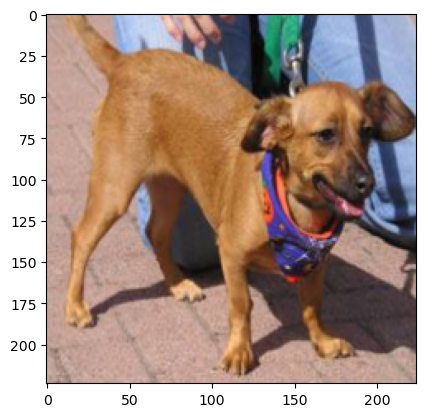

In [11]:
imshow(valid[241][0]) # ein Beispielbild anzeigen

## Create data generators

Die Daten werden nun einem Data Loader übergeben, welcher eine Zufallsverteilung und eine Organisation in "batches" vornimmt.

In [12]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=64,num_workers=0,shuffle=True)
valid_data_loader = torch.utils.data.DataLoader(valid,batch_size=64,num_workers=0,shuffle=True)

## 3. Netzwerk(struktur) definieren 

Der folgende Code definiert wie unser Netz definiert ist. Im Konstruktor `__init__(self):` werden die entsprechenden Variablen angelegt die [2-dimensionale Convolutional Layer](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html), [(2-dimensionale) Dropout Layer](https://pytorch.org/docs/stable/generated/torch.nn.Dropout2d.html) und [lineare Layer](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html).

In der `forward(self, x)` Funktion wird das Netz dann "zusammengebaut". Nach zwei [2-dimensionalen Convolutional Layern](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html) mit jeweils einem [max pooling Layer](https://pytorch.org/docs/stable/generated/torch.nn.functional.max_pool2d.html) an Ausgang (beim 2. [2-dimensionalen Convolutional Layer](https://pytorch.org/docs/stable/generated/torch.nn.Conv2d.html) wird zusätzlich der [(2-dimensionale) Dropout Layer](https://pytorch.org/docs/stable/generated/torch.nn.Dropout2d.html) verwendet) folgen zwei [lineare Layer](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) mit Dropout und [ReLU Aktivierungsfunktion](https://pytorch.org/docs/stable/generated/torch.nn.ReLU.html) und ein finaler [linearer Layer](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) mit finaler [Softmax Funktion](https://pytorch.org/docs/stable/generated/torch.nn.functional.softmax.html). 

In [13]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(56180, 500)
        self.fc2 = nn.Linear(500,50)
        self.fc3 = nn.Linear(50, 2)

    def forward(self, x):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(x.size(0), -1)
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = F.relu(self.fc2(x))
        x = F.dropout(x,training=self.training)
        x = self.fc3(x)
        return F.log_softmax(x,dim=1)

## 4. Anlegen des esten neuronalen Netzes

Nun teilen wir PyTorch durch Aufruf der Funktion [cuda()](https://pytorch.org/docs/stable/cuda.html) mit, dass wir das Modell gerne auf der Grafikkarte (GPU) gerechnet haben möchten.

In [67]:
model = Net()
if is_cuda:
    print("GPU (cuda) verfügbar: " + str(is_cuda))
    model.cuda()

GPU (cuda) verfügbar: True


## 5. Training des Netzes

Als Optimizer nehmen wir den bereits bekannten [stochastic gradient descent ](https://pytorch.org/docs/stable/generated/torch.optim.SGD.html) Algorithmus.

In [15]:
optimizer = optim.SGD(model.parameters(),lr=0.01,momentum=0.5)

Die im folgenden erstellte `fit()` Funktion kapselt den für das Training und die Evaluation notwendigen Code, so dass dieser nicht $2$x geschrieben werden muss (so wie z.B. in vorherigen Aufgaben geschehen).

Im folgenden Code-Abschnitt wird der [negative log likelihood loss](https://pytorch.org/docs/stable/generated/torch.nn.NLLLoss.html#torch.nn.NLLLoss)
[`nll_loss()`](https://pytorch.org/docs/stable/generated/torch.nn.functional.nll_loss.html) verwendet.

In [16]:
def fit(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output,target)
        
        running_loss += F.nll_loss(output, target, reduction='sum').item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()
    
    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)
    
    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [17]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in tqdm(range(1,20)):
    epoch_loss, epoch_accuracy = fit(epoch,model,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,model,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

  0%|          | 0/19 [00:00<?, ?it/s]

training loss is   0.7 and training accuracy is 546/1149     47.52
validation loss is  0.69 and validation accuracy is 138/250      55.2
training loss is  0.69 and training accuracy is 596/1149     51.87
validation loss is  0.69 and validation accuracy is 139/250      55.6
training loss is  0.69 and training accuracy is 599/1149     52.13
validation loss is  0.69 and validation accuracy is 150/250      60.0
training loss is  0.69 and training accuracy is 633/1149     55.09
validation loss is  0.68 and validation accuracy is 147/250      58.8
training loss is  0.69 and training accuracy is 621/1149     54.05
validation loss is  0.68 and validation accuracy is 148/250      59.2
training loss is  0.68 and training accuracy is 657/1149     57.18
validation loss is  0.68 and validation accuracy is 149/250      59.6
training loss is  0.68 and training accuracy is 660/1149     57.44
validation loss is  0.68 and validation accuracy is 139/250      55.6
training loss is  0.67 and training accur

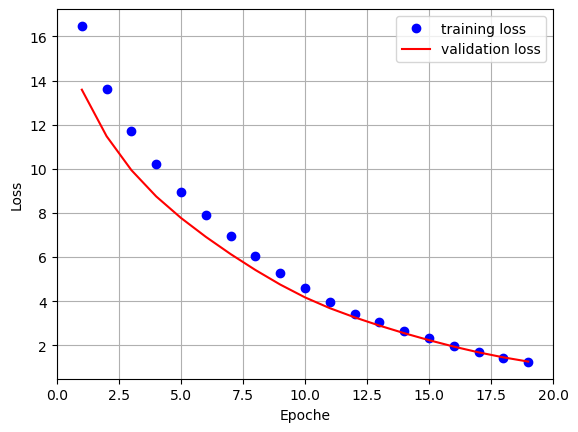

In [71]:
plt.plot(range(1,len(train_losses)+1),train_losses,'bo',label = 'training loss')
plt.plot(range(1,len(val_losses)+1),val_losses,'r',label = 'validation loss')
plt.legend()
plt.xlabel("Epoche")
plt.ylabel("Loss")
plt.xlim(0,20)
plt.grid(True)

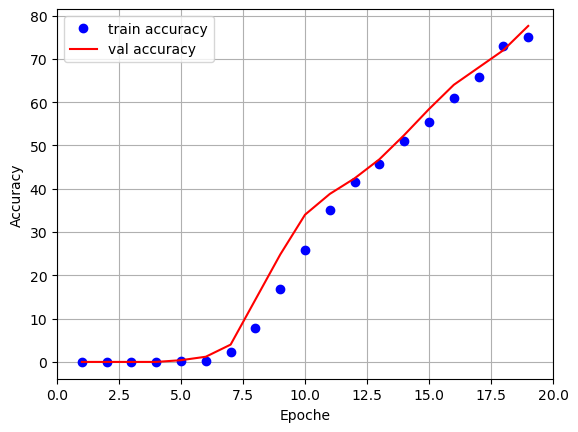

In [72]:
plt.plot(range(1,len(train_accuracy)+1),train_accuracy,'bo',label = 'train accuracy')
plt.plot(range(1,len(val_accuracy)+1),val_accuracy,'r',label = 'val accuracy')
plt.legend()
plt.xlabel("Epoche")
plt.ylabel("Accuracy")
plt.xlim(0,20)
plt.grid(True)

## Und jetzt das Ganze noch mal mit vortrainierten Netzen: Transfer learning using VGG

Das `VGG16`-Modell ist ein vortrainiertes neuronales Netz , das häufig für Bildklassifikationsaufgaben verwendet wird. Es wurde auf dem [**ImageNet-Datensatz**](https://www.image-net.org/about.php) trainiert und kann direkt für Transfer Learning oder Feature-Extraktion genutzt werden. Über den Parameter `weights='IMAGENET1K_V1'` werden die auf dem ImageNet-Datensatz vortrainierten Gewichte geladen.


In [20]:
vgg = models.vgg16(weights='IMAGENET1K_V1')
vgg = vgg.cuda() # verschieben des Modells auf die GPU

### Print VGG

Das VGG16-Modell besteht aus zwei Hauptkomponenten:  

- `features`: Verantwortlich für die **Merkmalserkennung** aus Bildern.  
- `classifier`: Nutzt diese Merkmale, um eine **Klassifikation** durchzuführen.  

Beide Teile sind als **Sequential-Module** organisiert, sodass das Modell leicht angepasst werden kann.  
Dadurch können wir die Parameter von `features` einfrieren und nur den `classifier` für unsere Klassifikationsaufgabe trainieren.  


In [21]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

## Schichten "einfrieren" (Freeze Layers)

Wir passen das vortrainierte VGG16-Modell für unsere Klassifikationstask an:

1. **Anpassung der letzten Klassifikationsschicht:**  
   - `vgg.classifier[6].out_features = 2`  
   - Die ursprüngliche Fully-Connected-Schicht (die 1000 Klassen für ImageNet vorhersagt) wird ersetzt, sodass das Modell nur noch **zwei Klassen** unterscheidet.

2. **Einfrieren der Feature-Extraktionsschichten:**  
   - `for param in vgg.features.parameters(): param.requires_grad = False`  
   - Die Gewichte der **features-Sequential** werden eingefroren, sodass sie während des Trainings **nicht aktualisiert** werden.  
   - Dadurch wird das vortrainierte Wissen der VGG16-Architektur erhalten, und nur der Klassifikationskopf wird trainiert.

In [22]:
vgg.classifier[6].out_features = 2
for param in vgg.features.parameters(): param.requires_grad = False


Es wird der **Stochastic Gradient Descent (SGD)** verwendet, um nur die Parameter des Klassifikationsmoduls zu optimieren.  

In [23]:
optimizer = optim.SGD(vgg.classifier.parameters(),lr=0.0001,momentum=0.5)

In [24]:
def fit(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        output = model(data)
        loss = F.cross_entropy(output,target)
        
        running_loss += F.cross_entropy(output,target,size_average=False).item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()
    
    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)
    
    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [25]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in tqdm(range(30)):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

  0%|          | 0/30 [00:00<?, ?it/s]

/opt/conda/lib/python3.11/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='sum' instead.
  warnings.warn(warning.format(ret))


training loss is 1.6e+01 and training accuracy is 0/1149       0.0
validation loss is 1.4e+01 and validation accuracy is 0/250       0.0
training loss is 1.4e+01 and training accuracy is 0/1149       0.0
validation loss is 1.1e+01 and validation accuracy is 0/250       0.0
training loss is 1.2e+01 and training accuracy is 0/1149       0.0
validation loss is   9.9 and validation accuracy is 0/250       0.0
training loss is 1e+01 and training accuracy is 0/1149       0.0
validation loss is   8.8 and validation accuracy is 0/250       0.0
training loss is   8.9 and training accuracy is 1/1149   0.08703
validation loss is   7.8 and validation accuracy is 1/250       0.4
training loss is   7.9 and training accuracy is 7/1149    0.6092
validation loss is   6.9 and validation accuracy is 3/250       1.2
training loss is   7.0 and training accuracy is 24/1149     2.089
validation loss is   6.1 and validation accuracy is 10/250       4.0
training loss is   6.1 and training accuracy is 92/1149  

### Adjusting Dropout  

Wir reduzieren die Dropout-Rate von 0.5 auf 0.2, um weniger Neuronen während des Trainings zufällig zu deaktivieren. Dadurch bleibt mehr Information erhalten, was das Lernen stabilisieren und die Leistung des Modells verbessern kann.  


In [26]:
for layer in vgg.classifier.children():
    if(type(layer) == nn.Dropout):
        layer.p = 0.2

In [27]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(3):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is   0.3 and training accuracy is 1080/1149     93.99
validation loss is  0.35 and validation accuracy is 230/250      92.0
training loss is  0.29 and training accuracy is 1077/1149     93.73
validation loss is  0.33 and validation accuracy is 230/250      92.0
training loss is  0.28 and training accuracy is 1075/1149     93.56
validation loss is  0.31 and validation accuracy is 232/250      92.8


### Data Augmentation  

Durch **[Data Augmentation](https://pytorch.org/vision/main/transforms.html)** erweitern wir unseren Trainingsdatensatz künstlich, um die Generalisierungsfähigkeit des Modells zu verbessern.

1. **Random Horizontal Flip:** Zufälliges Spiegeln der Bilder, um das Modell robuster gegenüber unterschiedlichen Ausrichtungen zu machen.  
2. **Random Rotation:** Zufällige Drehung der Bilder (bis zu 20%), um das Modell invarianter gegenüber Rotationen zu machen.  

Diese Transformationen sorgen dafür, dass das Modell auf einer größeren Vielfalt von Trainingsbeispielen lernt und somit besser auf neue, unbekannte Daten generalisieren kann.


In [28]:
train_transform = transforms.Compose([transforms.Resize((224,224))
                                       ,transforms.RandomHorizontalFlip()
                                       ,transforms.RandomRotation(0.2)
                                       ,transforms.ToTensor()
                                       ,transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                                      ])
train = ImageFolder(path + 'train/',train_transform)
valid = ImageFolder(path + 'valid/',simple_transform)

In [29]:
train_data_loader = DataLoader(train,batch_size=32,num_workers=0,shuffle=True)
valid_data_loader = DataLoader(valid,batch_size=32,num_workers=0,shuffle=True)

In [30]:
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(3):
    epoch_loss, epoch_accuracy = fit(epoch,vgg,train_data_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit(epoch,vgg,valid_data_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is  0.25 and training accuracy is 1082/1149     94.17
validation loss is  0.27 and validation accuracy is 236/250      94.4
training loss is  0.24 and training accuracy is 1090/1149     94.87
validation loss is  0.24 and validation accuracy is 237/250      94.8
training loss is  0.22 and training accuracy is 1093/1149     95.13
validation loss is  0.21 and validation accuracy is 238/250      95.2


## Calculating Pre-convoluted Features

In diesem Abschnitt extrahieren wir die **vorab extrahierten Merkmale** (Pre-convoluted Features) aus dem vortrainierten VGG16-Modell, bevor wir die Klassifikationsschicht verwenden. Dadurch können wir die Convolutional-Schichten als Feature-Extractor nutzen und die extrahierten Merkmale für ein späteres Training mit einem einfacheren Modell verwenden.


Die Idee dahinter ist, dass wir mit den vorab extrahierten Merkmalen ein einfacheres Modell trainieren können, das sich auf die Klassifikation konzentriert, während die komplexen Convolutional-Schichten vortrainiert bleiben und nur der Klassifikationskopf angepasst wird.


**Laden des vortrainierten VGG16-Modells:**
- Wir verwenden das vortrainierte VGG16-Modell von PyTorch, das bereits auf ImageNet trainiert wurde. Die Convolutional-Schichten (`features`) extrahieren Merkmale aus den Eingabebildern.


In [31]:
vgg = models.vgg16(weights='IMAGENET1K_V1')
vgg = vgg.cuda()

In [32]:
features = vgg.features

 **Einfrieren der Feature-Extraktionsschichten:**  
   - Alle Parameter der Convolutional-Schichten werden eingefroren (`param.requires_grad = False`), damit sie während des Trainings nicht aktualisiert werden.  

In [33]:
for param in features.parameters(): param.requires_grad = False


**Daten vorbereiten:**  
   - Wir erstellen DataLoader für Trainings- und Validierungsdaten, wobei **shuffle=False** gesetzt ist, damit die Reihenfolge der Daten für die Feature-Extraktion konstant bleibt.


In [34]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=32,num_workers=0,shuffle=False)
valid_data_loader = torch.utils.data.DataLoader(valid,batch_size=32,num_workers=0,shuffle=False)

 **Extraktion der vorab extrahierten Merkmale (Pre-convoluted Features):**  
   - Mit der Funktion `preconvfeat` extrahieren wir die Merkmale der Eingabebilder und speichern diese zusammen mit den zugehörigen Labels.  
   - Diese Merkmale werden als Eingabe für ein späteres Modell verwendet.


In [35]:
def preconvfeat(dataset,model):
    conv_features = []
    labels_list = []
    for data in dataset:
        inputs,labels = data
        if is_cuda:
            inputs , labels = inputs.cuda(),labels.cuda()       
        inputs , labels = Variable(inputs),Variable(labels)
        output = model(inputs)
        conv_features.extend(output.data.cpu().numpy())
        labels_list.extend(labels.data.cpu().numpy())
    conv_features = np.concatenate([[feat] for feat in conv_features])
    
    return (conv_features,labels_list)

In [36]:
conv_feat_train,labels_train = preconvfeat(train_data_loader,features)

In [37]:
conv_feat_val,labels_val = preconvfeat(valid_data_loader,features)

**Erstellen von Datasets und DataLoader für die extrahierten Merkmale:**  
   - Wir erstellen ein neues Dataset (`My_dataset`), das die extrahierten Merkmale und die Labels speichert. Dieses Dataset wird in `DataLoader` geladen, um die Merkmale in Chargen zu verarbeiten.


In [38]:
class My_dataset(Dataset):
    def __init__(self,feat,labels):
        self.conv_feat = feat
        self.labels = labels
    
    def __len__(self):
        return len(self.conv_feat)
    
    def __getitem__(self,idx):
        return self.conv_feat[idx],self.labels[idx]

In [39]:
train_feat_dataset = My_dataset(conv_feat_train,labels_train)
val_feat_dataset = My_dataset(conv_feat_val,labels_val)

In [40]:
train_feat_loader = DataLoader(train_feat_dataset,batch_size=64,shuffle=True)
val_feat_loader = DataLoader(val_feat_dataset,batch_size=64,shuffle=True)

Die Methode `data_gen()` ist ein Generator, der dazu dient, die extrahierten Merkmale (`conv_feat`) und die entsprechenden Labels (`labels`) in kleinen Chargen (Batches) zu liefern. Dies ist besonders nützlich, um den Speicherverbrauch zu reduzieren und das Training effizienter zu gestalten. 


In [41]:
def data_gen(conv_feat,labels,batch_size=64,shuffle=True):
    labels = np.array(labels)
    if shuffle:
        index = np.random.permutation(len(conv_feat))
        conv_feat = conv_feat[index]
        labels = labels[index]
    for idx in range(0,len(conv_feat),batch_size):
        yield(conv_feat[idx:idx+batch_size],labels[idx:idx+batch_size])

In [42]:
train_batches = data_gen(conv_feat_train,labels_train)
val_batches = data_gen(conv_feat_val,labels_val)

In [43]:
optimizer = optim.SGD(vgg.classifier.parameters(),lr=0.0001,momentum=0.5)

**Trainieren des Modells mit den extrahierten Merkmalen:**  
   - Ein einfacheres Modell wird auf den extrahierten Features trainiert. Der Optimierer (`SGD`) wird verwendet, um die Klassifikationsschicht zu trainieren, während die Convolutional-Schichten unverändert bleiben.


In [44]:
def fit_numpy(epoch,model,data_loader,phase='training',volatile=False):
    if phase == 'training':
        model.train()
    if phase == 'validation':
        model.eval()
        volatile=True
    running_loss = 0.0
    running_correct = 0
    for batch_idx , (data,target) in enumerate(data_loader):
        if is_cuda:
            data,target = data.cuda(),target.cuda()
        data , target = Variable(data,volatile),Variable(target)
        if phase == 'training':
            optimizer.zero_grad()
        data = data.view(data.size(0), -1)
        output = model(data)
        loss = F.cross_entropy(output,target)
        
        running_loss += F.cross_entropy(output,target,size_average=False).item()
        preds = output.data.max(dim=1,keepdim=True)[1]
        running_correct += preds.eq(target.data.view_as(preds)).cpu().sum()
        if phase == 'training':
            loss.backward()
            optimizer.step()
    
    loss = running_loss/len(data_loader.dataset)
    accuracy = 100. * running_correct/len(data_loader.dataset)
    
    print(f'{phase} loss is {loss:{5}.{2}} and {phase} accuracy is {running_correct}/{len(data_loader.dataset)}{accuracy:{10}.{4}}')
    return loss,accuracy

In [45]:
%%time
train_losses , train_accuracy = [],[]
val_losses , val_accuracy = [],[]
for epoch in range(1,20):
    epoch_loss, epoch_accuracy = fit_numpy(epoch,vgg.classifier,train_feat_loader,phase='training')
    val_epoch_loss , val_epoch_accuracy = fit_numpy(epoch,vgg.classifier,val_feat_loader,phase='validation')
    train_losses.append(epoch_loss)
    train_accuracy.append(epoch_accuracy)
    val_losses.append(val_epoch_loss)
    val_accuracy.append(val_epoch_accuracy)

training loss is 1.6e+01 and training accuracy is 0/1149       0.0
validation loss is 1.4e+01 and validation accuracy is 0/250       0.0
training loss is 1.4e+01 and training accuracy is 0/1149       0.0
validation loss is 1.1e+01 and validation accuracy is 0/250       0.0
training loss is 1.2e+01 and training accuracy is 0/1149       0.0
validation loss is   9.9 and validation accuracy is 0/250       0.0
training loss is 1e+01 and training accuracy is 0/1149       0.0
validation loss is   8.7 and validation accuracy is 0/250       0.0
training loss is   8.9 and training accuracy is 2/1149    0.1741
validation loss is   7.8 and validation accuracy is 1/250       0.4
training loss is   7.9 and training accuracy is 3/1149    0.2611
validation loss is   6.9 and validation accuracy is 3/250       1.2
training loss is   6.9 and training accuracy is 27/1149      2.35
validation loss is   6.1 and validation accuracy is 10/250       4.0
training loss is   6.1 and training accuracy is 90/1149  

## Visualizing intermediate CNN layers

In diesem Abschnitt visualisieren wir die Aktivierungen (Feature Maps) der Convolutional Layers (CNN-Schichten) eines vortrainierten VGG16-Modells.

Die Visualisierung der Aktivierungen ermöglicht es, zu verstehen, welche Merkmale das Modell in den frühen Schichten lernt. Diese Schichten extrahieren einfache Merkmale wie Kanten und Texturen, die später zu komplexeren Mustern kombiniert werden. Dies hilft, das Verständnis für die Funktionsweise von Convolutional Neural Networks zu vertiefen und kann bei der Fehlerbehebung und Modellanpassung hilfreich sein.

In [46]:
train_data_loader = torch.utils.data.DataLoader(train,batch_size=32,num_workers=0,shuffle=False)
img,label = next(iter(train_data_loader))

Ein zufälliges Bild unseres Datensatzes.

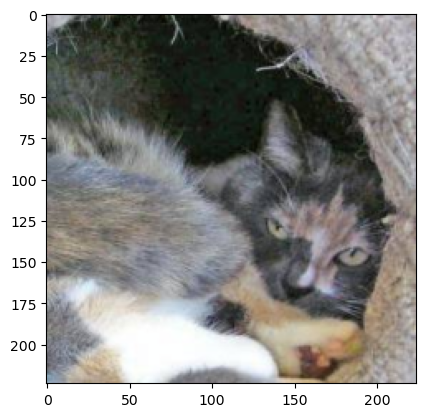

In [47]:
imshow(img[5])

In [48]:
img = img[5][None]

In [49]:
vgg = models.vgg16(weights='IMAGENET1K_V1').cuda()

`LayerActivations` ist eine Klasse, die es ermöglicht, die Ausgaben einer bestimmten Schicht während des Durchlaufs durch das Modell zu speichern.


In [50]:
class LayerActivations():
    features=None
    
    def __init__(self,model,layer_num):
        self.hook = model[layer_num].register_forward_hook(self.hook_fn)
    
    def hook_fn(self,module,input,output):
        self.features = output.cpu().data.numpy()
    
    def remove(self):
        self.hook.remove()
        

conv_out = LayerActivations(vgg.features,0)

o = vgg(Variable(img.cuda())) # .cuda() weglassen, wenn kein GPU vorhanden ist

conv_out.remove()

In [51]:
act = conv_out.features

Wir visualisieren die ersten 30 Feature Maps dieser Schicht.

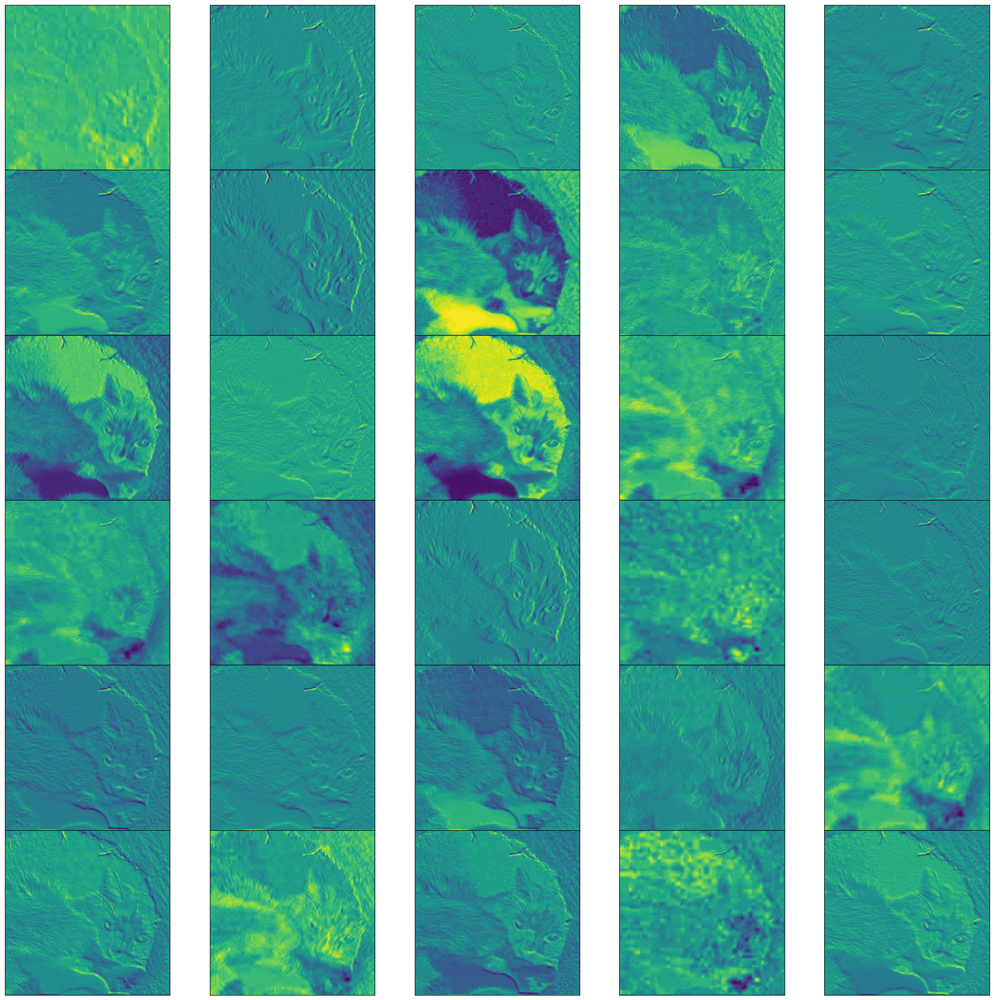

In [52]:
fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

In [53]:
vgg

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

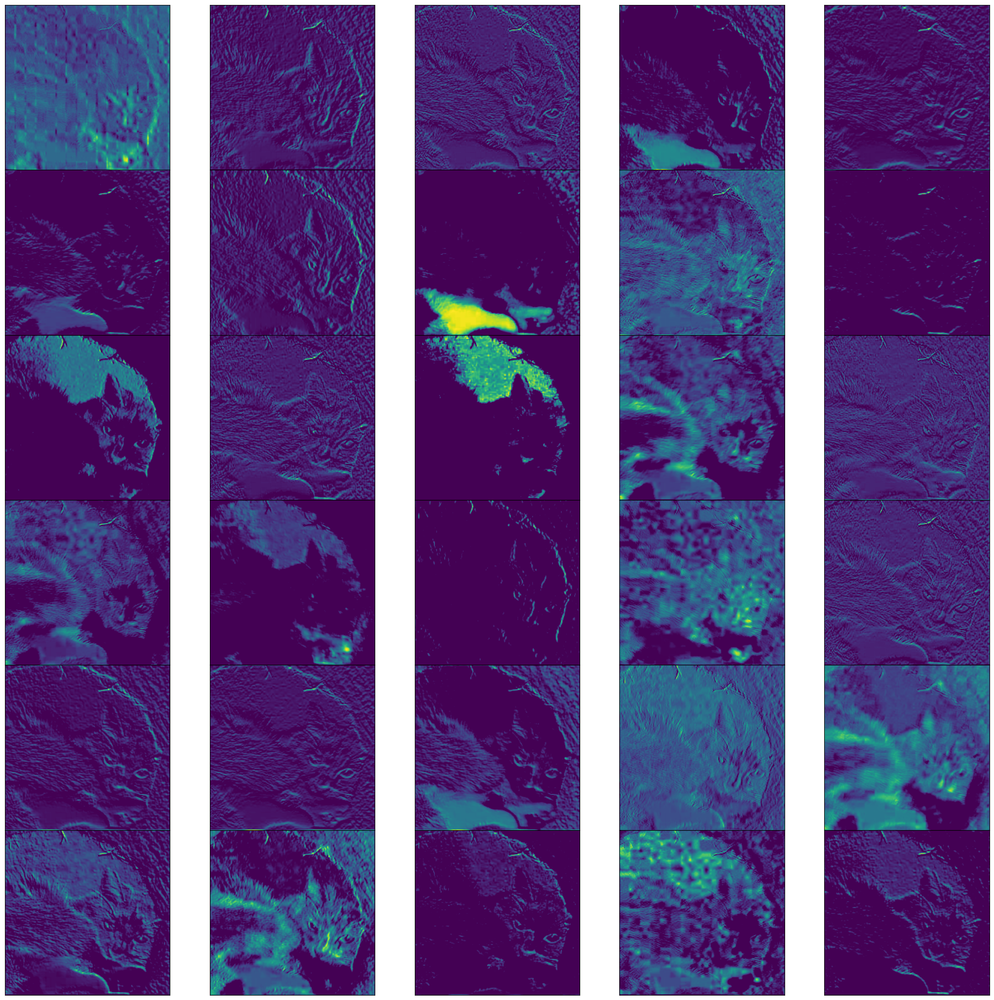

In [54]:
conv_out = LayerActivations(vgg.features,1)

o = vgg(Variable(img.cuda()))

conv_out.remove()

act = conv_out.features

fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

Die `imshow`-Funktion wird verwendet, um ein Bild-Tensor im Format `(C, H, W)` (Kanäle, Höhe, Breite) korrekt anzuzeigen:

Diese Funktion hilft dabei, Tensoren als sichtbare Bilder darzustellen.


In [55]:
def imshow(inp):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)

Dieser Schritt dient dazu, die Merkmale zu erhalten, die in der ersten Convolutional-Schicht des Modells extrahiert wurden.

In [56]:
conv_out = LayerActivations(vgg.features,1)

o = vgg(Variable(img.cuda()))

conv_out.remove()

act = conv_out.features

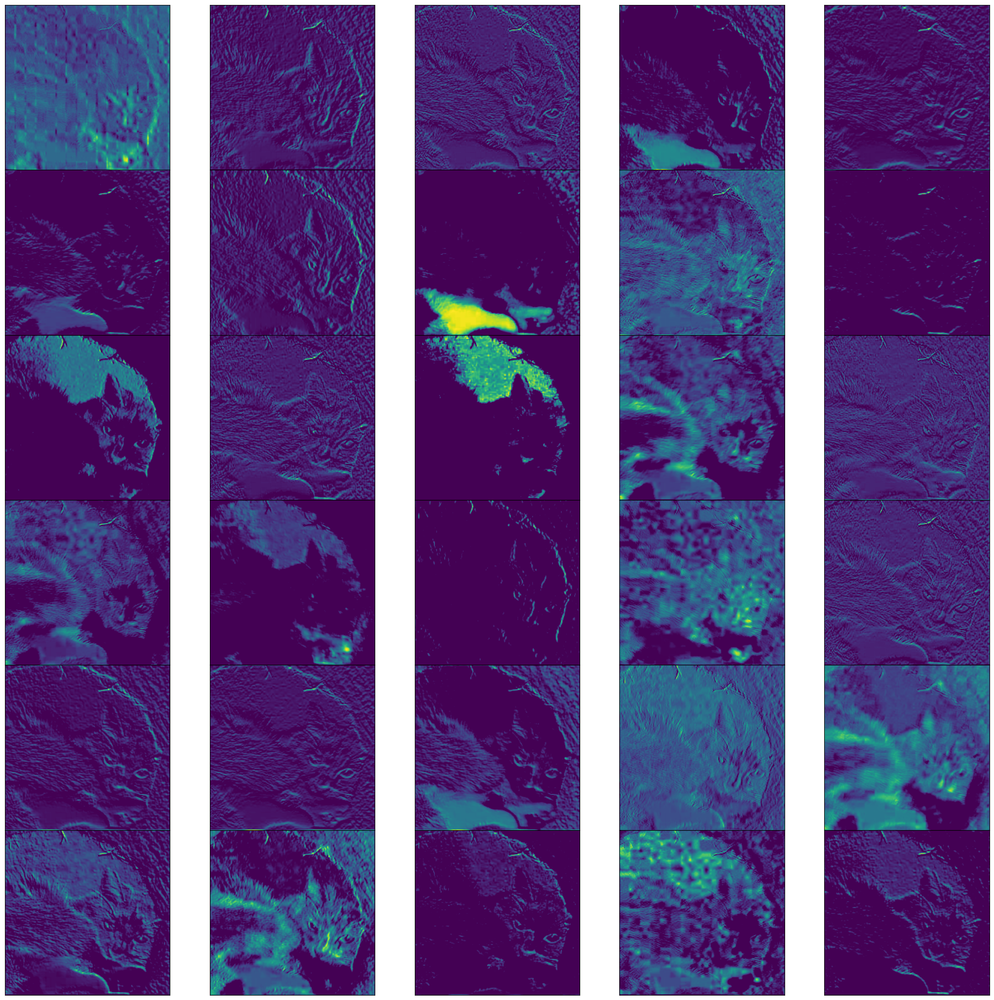

In [57]:
fig = plt.figure(figsize=(20,50))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,5,i+1,xticks=[],yticks=[])
    ax.imshow(act[0][i])

## Visualizing weights

Dieser Schritt ermöglicht es, die gelernten Filter (Gewichte) der ersten Convolutional-Schicht zu betrachten und zu verstehen, welche Muster das Modell lernt.

In [58]:
vgg = models.vgg16(pretrained=True).cuda()

/opt/conda/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [59]:
vgg.state_dict().keys()

odict_keys(['features.0.weight', 'features.0.bias', 'features.2.weight', 'features.2.bias', 'features.5.weight', 'features.5.bias', 'features.7.weight', 'features.7.bias', 'features.10.weight', 'features.10.bias', 'features.12.weight', 'features.12.bias', 'features.14.weight', 'features.14.bias', 'features.17.weight', 'features.17.bias', 'features.19.weight', 'features.19.bias', 'features.21.weight', 'features.21.bias', 'features.24.weight', 'features.24.bias', 'features.26.weight', 'features.26.bias', 'features.28.weight', 'features.28.bias', 'classifier.0.weight', 'classifier.0.bias', 'classifier.3.weight', 'classifier.3.bias', 'classifier.6.weight', 'classifier.6.bias'])

In [60]:

cnn_weights = vgg.state_dict()['features.0.weight'].cpu()

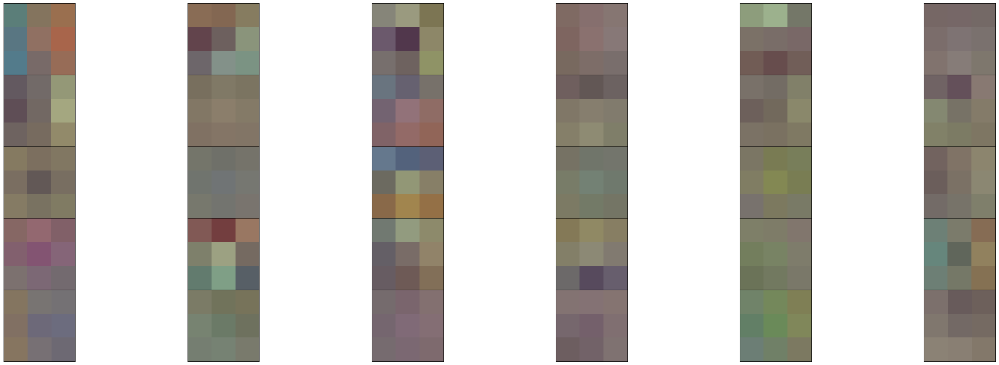

In [61]:
fig = plt.figure(figsize=(30,30))
fig.subplots_adjust(left=0,right=1,bottom=0,top=0.8,hspace=0,wspace=0.2)
for i in range(30):
    ax = fig.add_subplot(12,6,i+1,xticks=[],yticks=[])
    imshow(cnn_weights[i])

In [62]:
cnn_weights.shape

torch.Size([64, 3, 3, 3])